# We determine the AUC as a function of noise level for the Roessler Oscillator with Chaotic dynamics with 10 randomly unobserved out of 100 total species:

In [1]:
import numpy as np
import scipy as sc
import matplotlib.pyplot as plt
from scipy.integrate import odeint
import sys
import os
sys.path.append('packages/')
from utilities import *
from importlib import reload
#from utilities reload *
import utilities
import networkx as nx

from matplotlib import colors
from config.plot_config import *
import matplotlib as mpl

Loading plot config <matplotlib.colors.ListedColormap object at 0x7fabc80b2c30>


In [3]:
plt.rcParams.update({'font.size': 16,'font.family':'arial'})

In [5]:
#Parameters:
T      = 10.
deltaT = 0.001
num_species = 100
degree = 5.
num_subnw   = 90
num_bulk    = 10 #Convention: in the vector of conc. the subnetwork species appear first
parameters  = np.random.randn(num_species,num_species) #np.ones(num_species)*10
Ω           = 1.*((np.random.rand(num_species)*0.2)-0.1)

In [6]:
data4 = np.load("data/Roessler_long_trajectoryT1000000.npy",allow_pickle=True).item()

In [7]:
beta_opt4 = data4["beta"]
boundary4 = data4["boundary_list"]

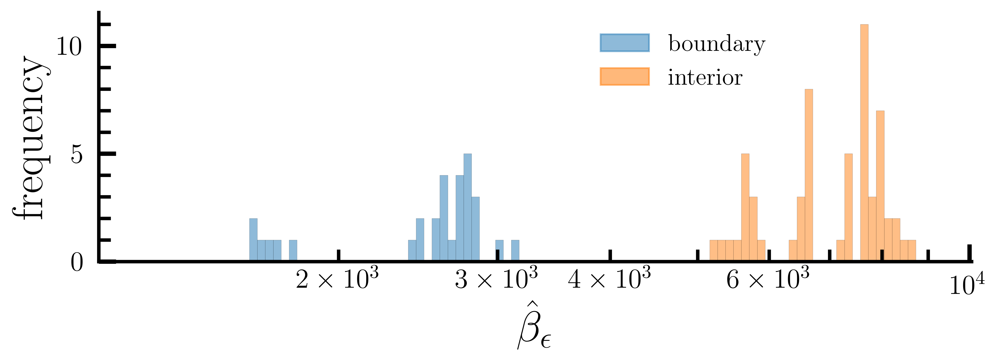

In [8]:
import matplotlib.patches as mpatches

#threshold = threshold_otsu_list_rep(vec, netw)['thresh']
#netw, reg, sim = get_par('egfr_m_s')

# precomputation
n_bins = 100
hist, bins, _ = plt.hist(data4["beta"][:,1], bins=n_bins)
plt.close()



fig = plt.figure(figsize=(7, 2), dpi=600)
ax = fig.add_axes([0, 0, 1, 1])

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# Edit the major and minor ticks of the x and y 
#ax.xaxis.set_tick_params(which='major', size=10, width=2, direction='in', top=False, pad=8)
#ax.xaxis.set_tick_params(which='minor', size=7, width=2, direction='in' , top=False, pad=3)
#ax.yaxis.set_tick_params(which='major', size=10, width=2, direction='in', right=False)
#ax.yaxis.set_tick_params(which='minor', size=7, width=2, direction='in' , right=False, pad=3)


logbins = np.logspace(np.log10(bins[0]),np.log10(bins[-1]),len(bins))

_, bins, patches   = ax.hist((data4["beta"][[i for i in range(num_subnw) if i not in boundary4],1]), color=COLORS(1), bins=logbins, alpha=.5, edgecolor='k', lw=.1)
_, bins2, patches2 = ax.hist((data4["beta"][[i for i in range(num_subnw) if i in boundary4],1]), color=COLORS(0), bins=logbins, alpha=.5, edgecolor='k', lw=.1)
    
ax.set_xscale('log')
ax.set_xlabel(s_beta_red_hat, labelpad=0)
ax.set_ylabel('frequency')

#ax.yaxis.set_major_locator(mpl.ticker.MultipleLocator(2))
#ax.yaxis.set_minor_locator(mpl.ticker.MultipleLocator(1))
#ax.set_xlim([0.9e3, 1.1e4])
ax.xaxis.set_major_locator(mpl.ticker.LogLocator(base=10, subs=(1,),numticks=10))
#ax.set_xticklabels([10**3,10**4])


boundary_patch = mpl.patches.Patch(color=COLORS(0), label='boundary', alpha=.5)
inner_patch = mpl.patches.Patch(color=COLORS(1), label='interior', alpha = .55)
ax.legend(handles=[boundary_patch, inner_patch], bbox_to_anchor=(.55, 1),loc=2, frameon=False, bbox_transform=ax.transAxes, fontsize=14)


ax.patch.set_alpha(0)

In [9]:
nw1 = nx.gnm_random_graph(num_species,num_species*degree,directed=True)

In [10]:
boundary_list = find_boundaries(nw1,np.arange(num_subnw,num_species))
print(boundary_list)

[ 1  4  5  7  9 12 13 14 15 17 18 20 22 23 26 32 34 37 39 43 46 47 50 51
 57 61 63 64 65 66 71 76 78 84]


In [12]:
len(boundary_list)

34

In [23]:
in_degree_list = np.array([nw1.in_degree[i] for i in range(num_species)])

In [26]:
in_edges_list = []
for i in range(num_species):
    in_edges_list.append([[p for p in nw1.in_edges(i)][n][0] for n in range(len([m for m in nw1.in_edges(i)]))])
print(in_edges_list)

[[26, 14, 32], [76, 85, 39, 27, 17, 92], [38, 11, 80, 86], [16, 2, 38, 65, 36], [69, 38, 52, 14, 53, 90, 51, 58], [88, 87, 24, 33, 16, 96, 51], [76, 17, 2], [65, 17, 4, 83, 94, 29, 46, 98, 64, 33, 97, 23, 9, 52], [65, 73, 4, 42, 19], [19, 21, 71, 95, 86, 58, 2], [89, 67, 49, 83, 55], [17, 76, 14, 74, 0], [79, 42, 16, 95, 30], [95, 5, 78, 44, 61, 88, 19], [34, 91, 27, 10, 55], [28, 73, 44, 91, 68, 11], [83, 47, 80, 2, 68], [99, 44, 39, 69, 2, 40], [22, 93, 50, 34], [88, 20, 31], [90, 37, 85, 26], [44, 10, 69, 42, 30, 47], [78, 6, 28, 91, 44, 35], [76, 20, 89, 40, 93], [43, 44, 71, 23], [69, 19, 72, 20], [67, 68, 50, 48, 93, 46], [57, 30, 48, 44, 14, 5], [16, 34, 45, 25], [37, 34, 62, 66, 75], [54, 41, 51], [15, 17], [98, 38, 2, 3], [41, 63, 30, 17, 28, 85, 35, 52, 40], [29, 99, 28, 31, 95], [86, 44, 57, 17, 71, 4, 23], [7, 76, 43], [34, 18, 95, 33], [49, 77, 4], [51, 92, 34, 71, 80, 83, 32], [62, 27, 41, 87, 14, 28, 44, 86, 50, 36, 23, 72, 68, 64], [2, 9, 1, 31, 32], [2, 12], [81, 25, 7

In [13]:
def dynamcical_system_RO_fast(t,x,in_degree_list,in_edges_list,Ω,num_osc=3):
    
    #Defines the Roessler oscillator system, num_osc defines the number of oscillators at each node!
    #Omega is the vector with alpha,beta and gamma
    
    x = x.reshape(num_species,num_osc)
    
    α = Ω[0] #+ ((np.random.rand(num_species)*0.2)-0.1)

    β = Ω[1] #+ 10.*((np.random.rand(num_species)*0.2)-0.1)
    
    γ = Ω[2]
    #Introduce a scaling for the strength of the interaction
    δ = Ω[3] #+ np.zeros(num_species)
    
    #y = np.zeros((nw.number_of_nodes(),num_osc))

    y = np.zeros(np.shape(x))
    
    y[:,0] = -x[:,1] - x[:,2]
    
    y[:,1] = x[:,0] + (α - δ*in_degree_list)*x[:,1]
    #y[:,1] = x[:,0] + α*x[:,1]

    y[:,2] = β + (x[:,0] - γ)*x[:,2]
    
    #print((α - np.array([nw1.in_degree[i] for i in range(num_species)])))
    
    for i in range(len(y)):
        #in_edges = [[p for p in nw.in_edges(i)][n][0] for n in range(len([m for m in nw.in_edges(i)]))]
        #print(in_edges)
        for j in in_edges_list[i]:
            #y[i,1] += c[i][j]*x[j,1]
            y[i,1] += δ[j]*x[j,1]
        in_edges = []
    
    return np.ravel(y)

In [14]:
def dynamcical_system_RO(t,x,nw,c,Ω,num_osc=3):
    
    #Defines the Roessler oscillator system, num_osc defines the number of oscillators at each node!
    #Omega is the vector with alpha,beta and gamma
    
    x = x.reshape(num_species,num_osc)
    
    α = Ω[0] #+ ((np.random.rand(num_species)*0.2)-0.1)

    β = Ω[1] #+ 10.*((np.random.rand(num_species)*0.2)-0.1)
    
    γ = Ω[2]
    #Introduce a scaling for the strength of the interaction
    δ = Ω[3] #+ np.zeros(num_species)
    
    y = np.zeros((nw.number_of_nodes(),num_osc))
    
    y[:,0] = -x[:,1] - x[:,2]
    
    y[:,1] = x[:,0] + (α - δ*np.array([nw1.in_degree[i] for i in range(num_species)]))*x[:,1]
    #y[:,1] = x[:,0] + α*x[:,1]

    y[:,2] = β + (x[:,0] - γ)*x[:,2]
    
    #print((α - np.array([nw1.in_degree[i] for i in range(num_species)])))
    
    for i in range(len(y)):
        in_edges = [[p for p in nw.in_edges(i)][n][0] for n in range(len([m for m in nw.in_edges(i)]))]
        #print(in_edges)
        for j in in_edges:
            #y[i,1] += c[i][j]*x[j,1]
            y[i,1] += δ[j]*x[j,1]
        in_edges = []
    
    return np.ravel(y)

In [15]:
Omega_chaotic_attractor = [0.2,0.2,5.7,1.]

In [16]:
#δ = 1. + 9.9999*((np.random.rand(num_species)*0.2)-0.1)
#δ = 1. + 5.*((np.random.rand(num_species)*0.2)-0.1)
δ = 0.01*np.ones(num_species)
#α = 0.2 + 1.999999*((np.random.rand(num_species)*0.2)-0.1)
α = 0.2*np.ones(num_species)

Omega_chaotic_attractor = [α,0.2,5.7,δ]

#α = 0.1*np.ones(num_species)
#δ = np.ones(num_species)
#Omega_chaotic_attractor = [α,0.1,14,δ]

In [17]:
init_chaotic_attractor = [-6, 0., 0.17]
#init_chaotic_attractor = [-1, 0., 0.17]

In [18]:
init_cond = init_chaotic_attractor

In [27]:
#Define reference run -- starting from an initial condition this lets the dynamics evolve to some periodic orbit
# in which the units are phase locked!

Num_osc   = 3

Num_samples = 1

deltaT = 0.1

T = 100.

Num_runs = 1

parameters = np.ones((num_species,num_species))

obs    = np.zeros([int(T/deltaT)*Num_runs,num_species*Num_osc,Num_samples])
soln   = np.zeros([int(T/deltaT)*Num_runs,num_species*Num_osc,Num_samples])
obs_noise = np.zeros([int(T/deltaT)*Num_runs,num_species*Num_osc,Num_samples])

for s in range(Num_samples):
    
    #Resample this for every sample:
    
    #parameters = 10*np.random.randn(num_species,num_species)
    #Ω          = 1.*((np.random.rand(num_species)*0.2)-0.1)

    for i in range(Num_runs):
        #init_cond = start_point + 0.1*((np.random.rand(num_species)*0.2) - 0.1)

        init_cond = np.ravel(init_chaotic_attractor*np.ones((num_species,3))) + 10.*np.ravel((np.random.rand(num_species,3)*0.2)-0.1)
        
        #init_cond = 10.*np.ravel((np.random.rand(num_species,3)*0.2)-0.1)
        
        #soln_temp = (sc.integrate.solve_ivp(dynamcical_system_RO,(0,T),init_cond,\
        #            t_eval=np.arange(0,T,deltaT),args=(nw1,parameters,Omega_chaotic_attractor,))).y.T

        soln_temp = (sc.integrate.solve_ivp(dynamcical_system_RO_fast,(0,T),init_cond,\
                                            t_eval=np.arange(0,T,deltaT),args=(in_degree_list,in_edges_list,Omega_chaotic_attractor,))).y.T

        soln[int(T/deltaT)*i:int(T/deltaT)*(i+1),:,s]    = soln_temp #- soln_ref

        for j in range(num_subnw*Num_osc):
            #for o in range(Num_osc):
            obs_noise[int(T/deltaT)*i:int(T/deltaT)*(i+1),j,s]   = np.gradient((soln_temp[:,j]),deltaT)

        obs[int(T/deltaT)*i:int(T/deltaT)*(i+1),:,s] = [dynamcical_system_RO(0,soln_temp[tt,:],\
                                         nw1,parameters,Omega_chaotic_attractor) for tt in range(int(T/deltaT))]
    
    # We call noisy observations in which we have taken numerical derivatives of the trajectory.


(0.0, 100.0)

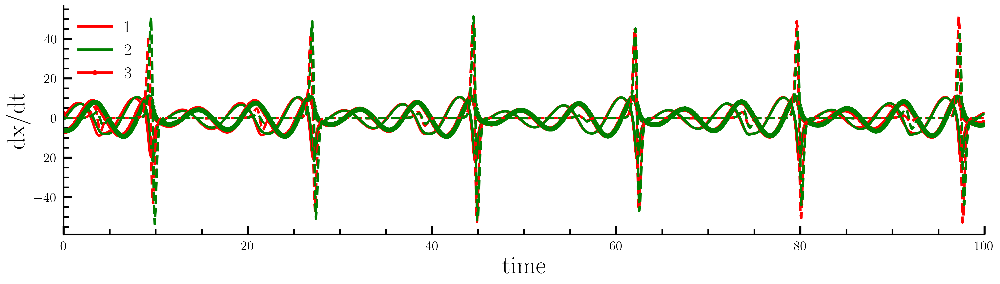

In [28]:
obs_noise_reshaped = obs_noise.reshape(int(T/deltaT)*Num_runs,num_species,Num_osc,Num_samples)

plt.figure(figsize=(20,5))
plt.plot(np.arange(0,Num_runs*T,deltaT),obs_noise_reshaped[:,0,0,0],c='r')
plt.plot(np.arange(0,Num_runs*T,deltaT),obs_noise_reshaped[:,1,0,0],c='g')
#plt.plot(np.arange(0,Num_runs*T,deltaT),obs_noise_reshaped[:,2,0,0],'b')

plt.plot(np.arange(0,Num_runs*T,deltaT),obs_noise_reshaped[:,0,1,0],'.-',c='r')
plt.plot(np.arange(0,Num_runs*T,deltaT),obs_noise_reshaped[:,1,1,0],'.-',c='g')
#plt.plot(np.arange(0,Num_runs*T,deltaT),obs_noise_reshaped[:,2,1,0],'.-','b')

plt.plot(np.arange(0,Num_runs*T,deltaT),obs_noise_reshaped[:,0,2,0],'--',c='r')
plt.plot(np.arange(0,Num_runs*T,deltaT),obs_noise_reshaped[:,1,2,0],'--',c='g')
#plt.plot(np.arange(0,Num_runs*T,deltaT),obs_noise_reshaped[:,2,2,0],'--','b')

#plt.plot(np.arange(0,Num_runs*T,deltaT),obs_noise_reshaped[:,3,0])
#plt.plot(np.arange(0,Num_runs*T,deltaT),obs_noise_reshaped[:,4,0])
#plt.plot(np.arange(0,Num_runs*T,deltaT),obs_noise_reshaped[:,5,0])

plt.xlabel('time',fontsize=30)
plt.ylabel('dx/dt',fontsize=30)
plt.legend(['1','2','3'],fontsize=20)
plt.xlim((0,100))
#plt.ylim((-4,4))

(0.0, 100.0)

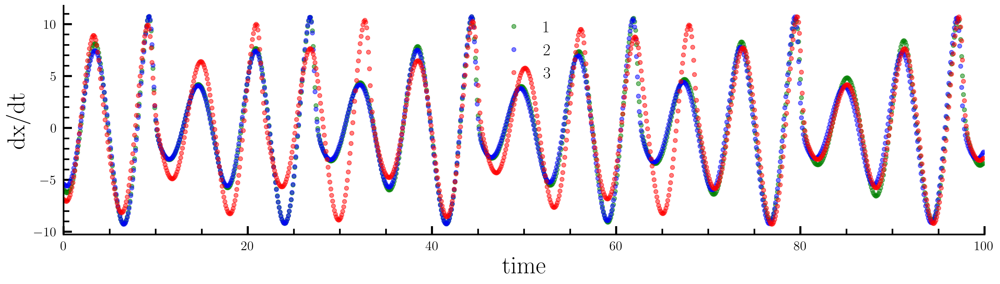

In [29]:
obs_noise_reshaped = obs_noise.reshape(int(T/deltaT)*Num_runs,num_species,Num_osc,Num_samples)

plt.figure(figsize=(20,5))
#plt.plot(np.arange(0,Num_runs*T,deltaT),obs_noise_reshaped[:,0,0,0],'r')
#plt.plot(np.arange(0,Num_runs*T,deltaT),obs_noise_reshaped[:,1,0,0],c='g')
#plt.plot(np.arange(0,Num_runs*T,deltaT),obs_noise_reshaped[:,2,0,0],'b')

#plt.plot(np.arange(0,Num_runs*T,deltaT),obs_noise_reshaped[:,0,1,0],'.-','r')
plt.plot(np.arange(0,Num_runs*T,deltaT),obs_noise_reshaped[:,1,1,0],'.',c='g',alpha=0.5)
plt.plot(np.arange(0,Num_runs*T,deltaT),obs_noise_reshaped[:,10,1,0],'.',c='b',alpha=0.5)
plt.plot(np.arange(0,Num_runs*T,deltaT),obs_noise_reshaped[:,20,1,0],'.',c='r',alpha=0.5)


#plt.plot(np.arange(0,Num_runs*T,deltaT),obs_noise_reshaped[:,2,1,0],'.-','b')

#plt.plot(np.arange(0,Num_runs*T,deltaT),obs_noise_reshaped[:,0,2,0],'--','r')
#plt.plot(np.arange(0,Num_runs*T,deltaT),obs_noise_reshaped[:,1,2,0],'--',c='g')
#plt.plot(np.arange(0,Num_runs*T,deltaT),obs_noise_reshaped[:,2,2,0],'--','b')

#plt.plot(np.arange(0,Num_runs*T,deltaT),obs_noise_reshaped[:,3,0])
#plt.plot(np.arange(0,Num_runs*T,deltaT),obs_noise_reshaped[:,4,0])
#plt.plot(np.arange(0,Num_runs*T,deltaT),obs_noise_reshaped[:,5,0])

plt.xlabel('time',fontsize=30)
plt.ylabel('dx/dt',fontsize=30)
plt.legend(['1','2','3'],fontsize=20)
plt.xlim((0,100))
#plt.ylim()
#plt.ylim((-2,2))

(0.0, 100.0)

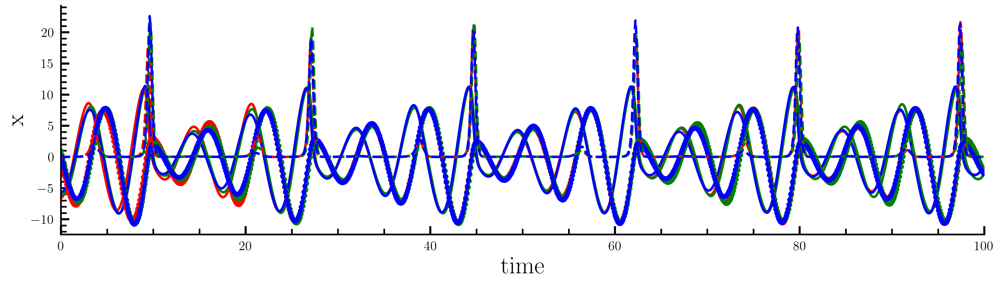

In [30]:
soln_reshaped = soln.reshape(int(T/deltaT)*Num_runs,num_species,Num_osc,Num_samples)

plt.figure(figsize=(20,5))
plt.plot(np.arange(0,Num_runs*T,deltaT),soln_reshaped[:,0,0,0],c='r')
plt.plot(np.arange(0,Num_runs*T,deltaT),soln_reshaped[:,1,0,0],c='g')
plt.plot(np.arange(0,Num_runs*T,deltaT),soln_reshaped[:,2,0,0],c='b')

plt.plot(np.arange(0,Num_runs*T,deltaT),soln_reshaped[:,0,1,0],'.-',c='r')
plt.plot(np.arange(0,Num_runs*T,deltaT),soln_reshaped[:,1,1,0],'.-',c='g')
plt.plot(np.arange(0,Num_runs*T,deltaT),soln_reshaped[:,2,1,0],'.-',c='b')

plt.plot(np.arange(0,Num_runs*T,deltaT),soln_reshaped[:,0,2,0],'--',c='r')
plt.plot(np.arange(0,Num_runs*T,deltaT),soln_reshaped[:,1,2,0],'--',c='g')
plt.plot(np.arange(0,Num_runs*T,deltaT),soln_reshaped[:,2,2,0],'--',c='b')

plt.xlabel('time',fontsize=30)
plt.ylabel('x',fontsize=30)
#plt.legend(['1','2','3','4','5'],fontsize=20)
#plt.xlim((0,5))
plt.xlim((0,100))
#plt.ylim(-1,1)

(0.0, 100.0)

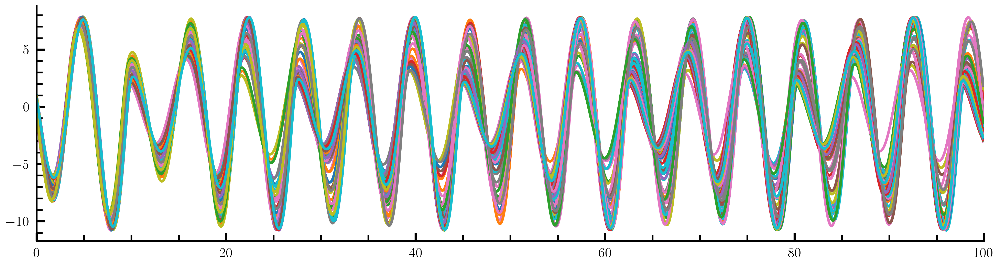

In [31]:
plt.figure(figsize=(20,5))
for i in range(num_species):
    plt.plot(np.arange(0,Num_runs*T,deltaT),soln_reshaped[:,i,1,0])
#plt.plot(np.arange(0,Num_runs*T,deltaT),soln_reshaped[:,1,1,0])
#plt.plot(np.arange(0,Num_runs*T,deltaT),soln_reshaped[:,2,1,0])
plt.xlim((0,100))

#### The (chaotic) spiking behaviour of the oscillator is apparant here!

## Plots for the paper!

In [33]:
from matplotlib import lines
lines.lineStyles.keys()

dict_keys(['-', '--', '-.', ':', 'None', ' ', ''])

In [34]:
from collections import OrderedDict

linestyles = OrderedDict(
    [('solid',               (0, ())),
     ('loosely dotted',      (0, (1, 10))),
     ('dotted',              (0, (1, 5))),
     ('densely dotted',      (0, (1, 1))),

     ('loosely dashed',      (0, (5, 10))),
     ('dashed',              (0, (5, 5))),
     ('densely dashed',      (0, (5, 1))),

     ('loosely dashdotted',  (0, (3, 10, 1, 10))),
     ('dashdotted',          (0, (3, 5, 1, 5))),
     ('densely dashdotted',  (0, (3, 1, 1, 1))),

     ('loosely dashdotdotted', (0, (3, 10, 1, 10, 1, 10))),
     ('dashdotdotted',         (0, (3, 5, 1, 5, 1, 5))),
     ('densely dashdotdotted', (0, (3, 1, 1, 1, 1, 1)))])

In [35]:
ls_list = []
for i in enumerate(linestyles):
    ls_list.append(i[1])
    print(linestyles[i[1]])

(0, ())
(0, (1, 10))
(0, (1, 5))
(0, (1, 1))
(0, (5, 10))
(0, (5, 5))
(0, (5, 1))
(0, (3, 10, 1, 10))
(0, (3, 5, 1, 5))
(0, (3, 1, 1, 1))
(0, (3, 10, 1, 10, 1, 10))
(0, (3, 5, 1, 5, 1, 5))
(0, (3, 1, 1, 1, 1, 1))


/tmp/ipykernel_276031/2887940114.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


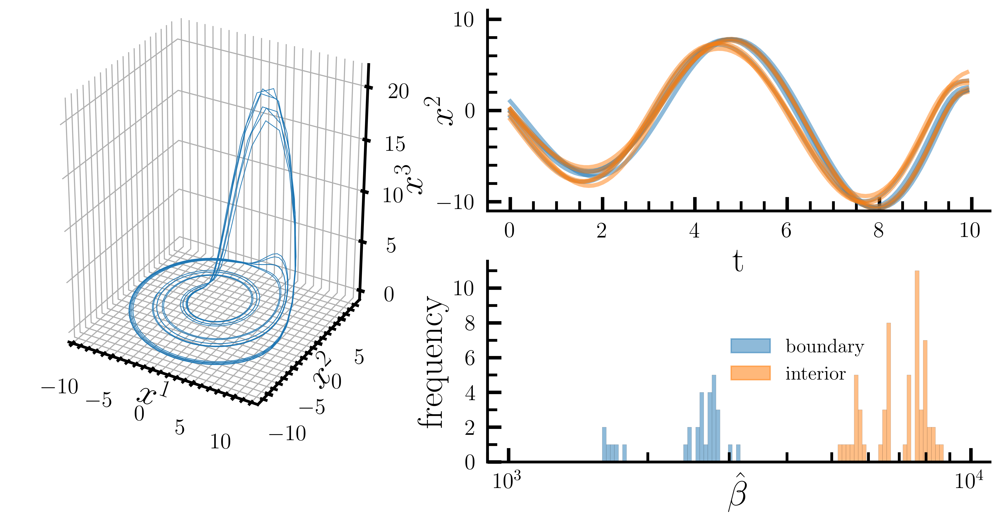

In [41]:
#ax = plt.figure(figsize=(4,4)).add_subplot(projection='3d')

fig = plt.figure(figsize=(10,5),dpi=600)

#ax = fig.add_subplot(projection='3d')

ax = fig.add_axes([0, 0, 0.4, 1],projection='3d')

F=10**6

ax.plot(soln_reshaped[:F,0,0,0], soln_reshaped[:F,0,1,0], soln_reshaped[:F,0,2,0], label='Node 0'\
,linestyle='solid',linewidth=0.5)

#ax.plot(soln_reshaped[:,10,0,0], soln_reshaped[:,10,1,0], soln_reshaped[:,10,2,0], label='Node 10',linestyle='dashed')
#ax.legend()

ax.set_xlabel(r'$x^1$',labelpad=-10)
ax.set_ylabel(r'$x^2$',labelpad=-9)
ax.set_zlabel(r'$x^3$',labelpad=5)

#ax.set_xticklabels(labelpad=-15)

#ax.set_xlim((-13,13))

ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax.zaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))

#ax.dist = 100

ax.set_box_aspect(aspect=(0.8,0.8,1), zoom=1)

#ax.set_box_aspect(aspect=None, zoom=0.8)

#inset = fig.add_axes([0.25,0.6,0.25,0.15])

#T1=5
#for i in range(num_subnw):
#    inset.plot(np.arange(0,Num_runs*T1,deltaT),soln_reshaped[:int(T1/deltaT),i,1,0],linewidth=0.5)
#inset.spines['right'].set_visible(False)
#inset.spines['top'].set_visible(False)
#inset.set_ylim((-11,11))
##ax_1[i].spines['right'].set_visible(False)
##ax_1[i].spines['top'].set_visible(False)

##ax.set_facecolor('white')
##ax.set_axis_bgcolor('white')

T1=10
ax2 = fig.add_axes([0.475,0.5,0.5,0.4])
j = 0
#for i in range(0,num_subnw,10):
    #ax2.plot(np.arange(0,Num_runs*T1,deltaT),soln_reshaped[:int(T1/deltaT),i,1,0],linewidth=2,alpha=0.75,c=COLORS(j))
#    j+=1

for i in boundary_list[:5]:
    ax2.plot(np.arange(0,Num_runs*T1,deltaT),soln_reshaped[:int(T1/deltaT),i,1,0],linewidth=3,alpha=0.5,c=COLORS(0)),\
#             linestyle=linestyles[ls_list[j]])
    j+=1

for i in [j for j in range(num_subnw) if j not in boundary_list][:5]:
    ax2.plot(np.arange(0,Num_runs*T1,deltaT),soln_reshaped[:int(T1/deltaT),i,1,0],linewidth=3,alpha=0.5,c=COLORS(1)),\
#             linestyle=linestyles[ls_list[j]])
    j+=1

#ax2_inset = fig.add_axes([0.5,0.8,0.15,0.1])

#T1 = 0.2
#j = 0

#for i in boundary_list[:5]:
#    ax2_inset.plot(np.arange(0,Num_runs*T1,deltaT),soln_reshaped[:int(T1/deltaT),i,1,0],linewidth=3,alpha=0.75,c=COLORS(0),\
#             linestyle=linestyles[ls_list[j]])
#    j+=1

#for i in [j for j in range(num_subnw) if j not in boundary_list][:5]:
#    ax2_inset.plot(np.arange(0,Num_runs*T1,deltaT),soln_reshaped[:int(T1/deltaT),i,1,0],linewidth=3,alpha=0.75,c=COLORS(1),\
#             linestyle=linestyles[ls_list[j]])
#    j+=1

    
ax2.spines['right'].set_visible(False)
ax2.spines['top'].set_visible(False)
ax2.set_ylim((-11,11))
ax2.set_xlabel('t')
ax2.set_ylabel(r'$x^2$',labelpad=-16)#,loc=(0.5,0.5))

ax3 = fig.add_axes([0.475, 0, 0.5, 0.4])

#ax3.spines['right'].set_visible(False)
#ax3.spines['top'].set_visible(False)

# Edit the major and minor ticks of the x and y 
#ax.xaxis.set_tick_params(which='major', size=10, width=2, direction='in', top=False, pad=8)
#ax.xaxis.set_tick_params(which='minor', size=7, width=2, direction='in' , top=False, pad=3)
#ax.yaxis.set_tick_params(which='major', size=10, width=2, direction='in', right=False)
#ax.yaxis.set_tick_params(which='minor', size=7, width=2, direction='in' , right=False, pad=3)


logbins = np.logspace(np.log10(bins[0]),np.log10(bins[-1]),len(bins))

#_, bins, patches = ax3.hist((beta_opt3[[i for i in range(num_subnw) if i not in boundary2],1]), color=COLORS(1), bins=logbins, alpha=.5, edgecolor='k', lw=.1)
#_, bins2, patches2 = ax3.hist((beta_opt3[[i for i in range(num_subnw) if i in boundary2],1]), color=COLORS(0), bins=logbins, alpha=.5, edgecolor='k', lw=.1)

_, bins, patches   = ax3.hist((data4["beta"][[i for i in range(num_subnw) if i not in boundary4],1]), color=COLORS(1), bins=logbins, alpha=.5, edgecolor='k', lw=.1)
_, bins2, patches2 = ax3.hist((data4["beta"][[i for i in range(num_subnw) if i in boundary4],1]), color=COLORS(0), bins=logbins, alpha=.5, edgecolor='k', lw=.1)

ax3.set_xscale('log')
ax3.set_xlabel(s_beta_hat, labelpad=-15)
ax3.set_ylabel('frequency')

ax3.yaxis.set_major_locator(mpl.ticker.MultipleLocator(2))
ax3.yaxis.set_minor_locator(mpl.ticker.MultipleLocator(1))
ax3.set_xlim([0.9e3, 1.1e4])
ax3.xaxis.set_major_locator(mpl.ticker.LogLocator(base=10, subs=(0.1,),numticks=10))
#ax.set_xticklabels([10**3,10**4])


boundary_patch = mpl.patches.Patch(color=COLORS(0), label='boundary', alpha=.5)
inner_patch = mpl.patches.Patch(color=COLORS(1), label='interior', alpha = .55)
ax3.legend(handles=[boundary_patch, inner_patch], bbox_to_anchor=(.45, 0.7),loc=2, frameon=False, bbox_transform=ax3.transAxes, fontsize=14)

ax3.patch.set_alpha(0)

plt.tight_layout()
plt.show()

/tmp/ipykernel_498451/1468100407.py:99: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


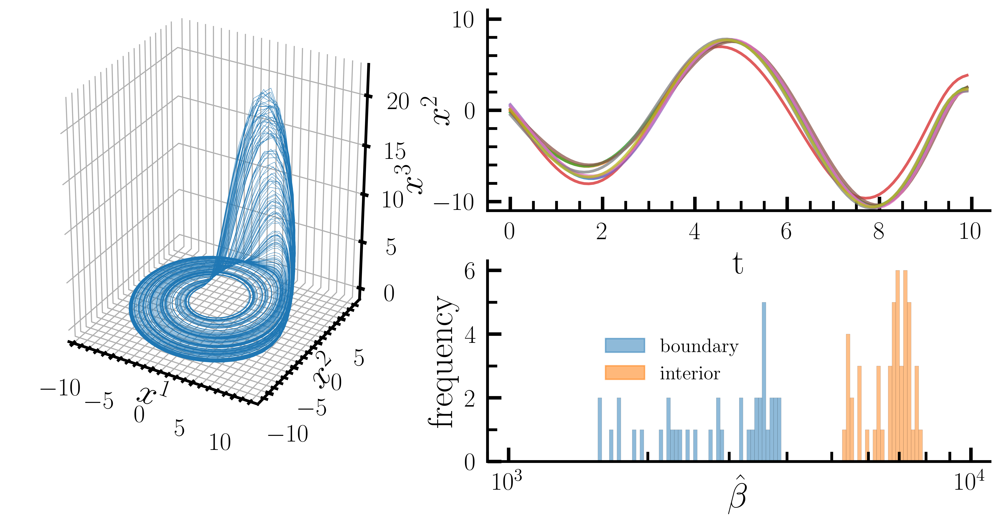

In [372]:
#ax = plt.figure(figsize=(4,4)).add_subplot(projection='3d')

fig = plt.figure(figsize=(10,5),dpi=600)

#ax = fig.add_subplot(projection='3d')

ax = fig.add_axes([0, 0, 0.4, 1],projection='3d')

F=10**4

ax.plot(soln_reshaped[:F,0,0,0], soln_reshaped[:F,0,1,0], soln_reshaped[:F,0,2,0], label='Node 0'\
,linestyle='solid',linewidth=0.25)
#ax.plot(soln_reshaped[:,10,0,0], soln_reshaped[:,10,1,0], soln_reshaped[:,10,2,0], label='Node 10',linestyle='dashed')
#ax.legend()

ax.set_xlabel(r'$x^1$',labelpad=-10)
ax.set_ylabel(r'$x^2$',labelpad=-9)
ax.set_zlabel(r'$x^3$',labelpad=5)

#ax.set_xticklabels(labelpad=-15)

#ax.set_xlim((-13,13))

ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax.zaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))

#ax.dist = 100

ax.set_box_aspect(aspect=(0.8,0.8,1), zoom=1)

#ax.set_box_aspect(aspect=None, zoom=0.8)

#inset = fig.add_axes([0.25,0.6,0.25,0.15])

#T1=5
#for i in range(num_subnw):
#    inset.plot(np.arange(0,Num_runs*T1,deltaT),soln_reshaped[:int(T1/deltaT),i,1,0],linewidth=0.5)
#inset.spines['right'].set_visible(False)
#inset.spines['top'].set_visible(False)
#inset.set_ylim((-11,11))
##ax_1[i].spines['right'].set_visible(False)
##ax_1[i].spines['top'].set_visible(False)

##ax.set_facecolor('white')
##ax.set_axis_bgcolor('white')

T1=10
ax2 = fig.add_axes([0.475,0.5,0.5,0.4])
j = 0
for i in range(0,num_subnw,10):
    ax2.plot(np.arange(0,Num_runs*T1,deltaT),soln_reshaped[:int(T1/deltaT),i,1,0],linewidth=2,alpha=0.75,c=COLORS(j))
    j+=1
ax2.spines['right'].set_visible(False)
ax2.spines['top'].set_visible(False)
ax2.set_ylim((-11,11))
ax2.set_xlabel('t')
ax2.set_ylabel(r'$x^2$',labelpad=-16)

ax3 = fig.add_axes([0.475, 0, 0.5, 0.4])

#ax3.spines['right'].set_visible(False)
#ax3.spines['top'].set_visible(False)

# Edit the major and minor ticks of the x and y 
#ax.xaxis.set_tick_params(which='major', size=10, width=2, direction='in', top=False, pad=8)
#ax.xaxis.set_tick_params(which='minor', size=7, width=2, direction='in' , top=False, pad=3)
#ax.yaxis.set_tick_params(which='major', size=10, width=2, direction='in', right=False)
#ax.yaxis.set_tick_params(which='minor', size=7, width=2, direction='in' , right=False, pad=3)


logbins = np.logspace(np.log10(bins[0]),np.log10(bins[-1]),len(bins))

_, bins, patches = ax3.hist((beta_opt_d2[[i for i in range(num_subnw) if i not in boundary_list],1]), color=COLORS(1), bins=logbins, alpha=.5, edgecolor='k', lw=.1)
_, bins2, patches2 = ax3.hist((beta_opt_d2[[i for i in range(num_subnw) if i in boundary_list],1]), color=COLORS(0), bins=logbins, alpha=.5, edgecolor='k', lw=.1)
    
ax3.set_xscale('log')
ax3.set_xlabel(s_beta_hat, labelpad=-15)
ax3.set_ylabel('frequency')

ax3.yaxis.set_major_locator(mpl.ticker.MultipleLocator(2))
ax3.yaxis.set_minor_locator(mpl.ticker.MultipleLocator(1))
ax3.set_xlim([0.9e3, 1.1e4])
ax3.xaxis.set_major_locator(mpl.ticker.LogLocator(base=10, subs=(0.1,),numticks=10))
#ax.set_xticklabels([10**3,10**4])


boundary_patch = mpl.patches.Patch(color=COLORS(0), label='boundary', alpha=.5)
inner_patch = mpl.patches.Patch(color=COLORS(1), label='interior', alpha = .55)
ax3.legend(handles=[boundary_patch, inner_patch], bbox_to_anchor=(.2, 0.7),loc=2, frameon=False, bbox_transform=ax3.transAxes, fontsize=14)


ax3.patch.set_alpha(0)

plt.tight_layout()
plt.show()